## **Kaggle S4E10: Loan Approval Prediction**

#### Binary classification task
#### Evaluation metric: `ROC-AUC`
#### Target column: `loan_status`

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import math
import numpy as np
from sklearn.model_selection import RepeatedStratifiedKFold, RepeatedKFold
from sklearn.model_selection import cross_val_score

from sklearn.ensemble import HistGradientBoostingClassifier
from catboost import CatBoostClassifier
import itertools
#import torch

In [2]:
df = pd.read_csv('../train.csv', index_col='id')
print('Train data shape:', df.shape)
df_test = pd.read_csv('../test.csv', index_col='id')
print('Test data shape:', df_test.shape)

Train data shape: (58645, 12)
Test data shape: (39098, 11)


In [3]:
df.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,loan_status
id,,,,,,,,,,,,
0,37,35000,RENT,0.0,EDUCATION,B,6000,11.49,0.17,N,14,0
1,22,56000,OWN,6.0,MEDICAL,C,4000,13.35,0.07,N,2,0
2,29,28800,OWN,8.0,PERSONAL,A,6000,8.90,0.21,N,10,0
3,30,70000,RENT,14.0,VENTURE,B,12000,11.11,0.17,N,5,0
4,22,60000,RENT,2.0,MEDICAL,A,6000,6.92,0.10,N,3,0


In [4]:
df_test.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
id,,,,,,,,,,,
58645,23,69000,RENT,3.0,HOMEIMPROVEMENT,F,25000,15.76,0.36,N,2
58646,26,96000,MORTGAGE,6.0,PERSONAL,C,10000,12.68,0.10,Y,4
58647,26,30000,RENT,5.0,VENTURE,E,4000,17.19,0.13,Y,2
58648,33,50000,RENT,4.0,DEBTCONSOLIDATION,A,7000,8.90,0.14,N,7
58649,26,102000,MORTGAGE,8.0,HOMEIMPROVEMENT,D,15000,16.32,0.15,Y,4


In [5]:
# Separate the features and the target

X = df.drop(columns=['loan_status'])
y = df['loan_status']
X_test = df_test.copy()

### **1. Preliminary data investigation**

Find the categorical and numerical columns

In [6]:
categorical_columns = [col for col in X.columns if X[col].dtype == 'object']
numerical_columns = [col for col in X.columns if X[col].dtype != 'object']
print('Categorical columns:', categorical_columns, '\n')
print('Numerical columns:', numerical_columns, '\n')

X.info()
print('\n')
X_test.info()

Categorical columns: ['person_home_ownership', 'loan_intent', 'loan_grade', 'cb_person_default_on_file'] 

Numerical columns: ['person_age', 'person_income', 'person_emp_length', 'loan_amnt', 'loan_int_rate', 'loan_percent_income', 'cb_person_cred_hist_length'] 

<class 'pandas.core.frame.DataFrame'>
Index: 58645 entries, 0 to 58644
Data columns (total 11 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  58645 non-null  int64  
 1   person_income               58645 non-null  int64  
 2   person_home_ownership       58645 non-null  object 
 3   person_emp_length           58645 non-null  float64
 4   loan_intent                 58645 non-null  object 
 5   loan_grade                  58645 non-null  object 
 6   loan_amnt                   58645 non-null  int64  
 7   loan_int_rate               58645 non-null  float64
 8   loan_percent_income         58645 non-null  float64
 9   

Check the number of missing values

In [7]:
print('Number of missing values in train data:', X.isnull().sum().sum(), '\n')
print('Number of missing values in test data:', X_test.isnull().sum().sum(), '\n')

Number of missing values in train data: 0 

Number of missing values in test data: 0 



Check for duplicates

In [8]:
print('Number of duplicates in train data:', X.duplicated().sum(), '\n')
print('Number of duplicates in test data:', X_test.duplicated().sum(), '\n')

Number of duplicates in train data: 0 

Number of duplicates in test data: 0 



Check if the 'loan_status' column is balanced

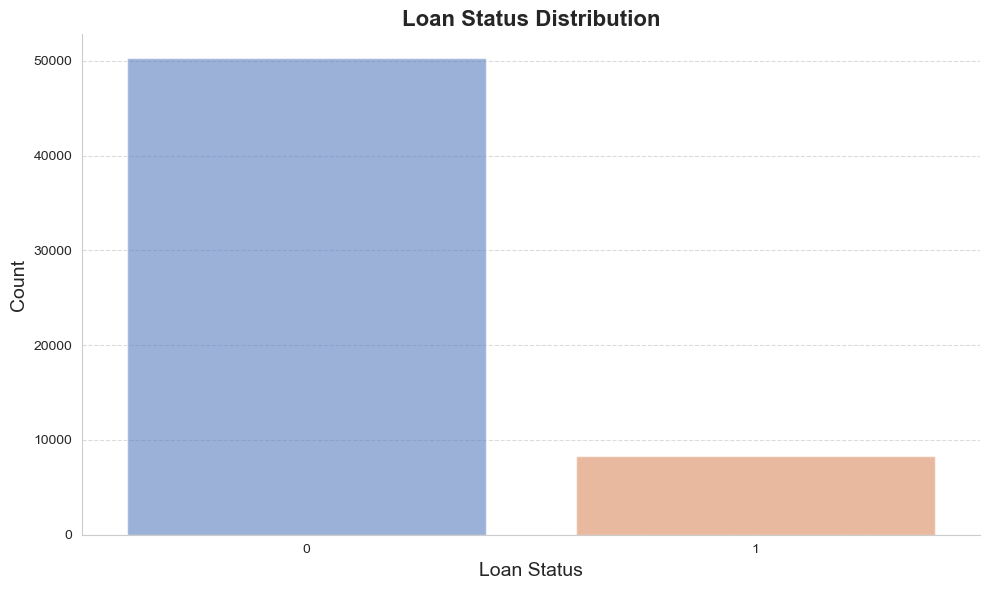

Number of loans that were approved: 50295 

Number of loans that were not approved: 8350 

Ratio: 6.02 



In [9]:
plt.figure(figsize=(10, 6))
sns.set_style("whitegrid")  

sns.countplot(x='loan_status', hue='loan_status', data=df, palette="muted", alpha=0.6,dodge=False, legend=False)

plt.title('Loan Status Distribution', fontsize=16, fontweight='bold')
plt.xlabel('Loan Status', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)
sns.despine()

plt.tight_layout()
plt.show()

print('Number of loans that were approved:', (df['loan_status'] == 0).sum(), '\n')
print('Number of loans that were not approved:', (df['loan_status'] == 1).sum(), '\n')
print('Ratio:', round((df['loan_status'] == 0).sum() / (df['loan_status'] == 1).sum(), 2), '\n')


We see that the data is imbalanced, with the number of loans that were approved being 6 times the number of loans that were not approved. 

### **2. Numerical columns**
#### 2.1 Density plots

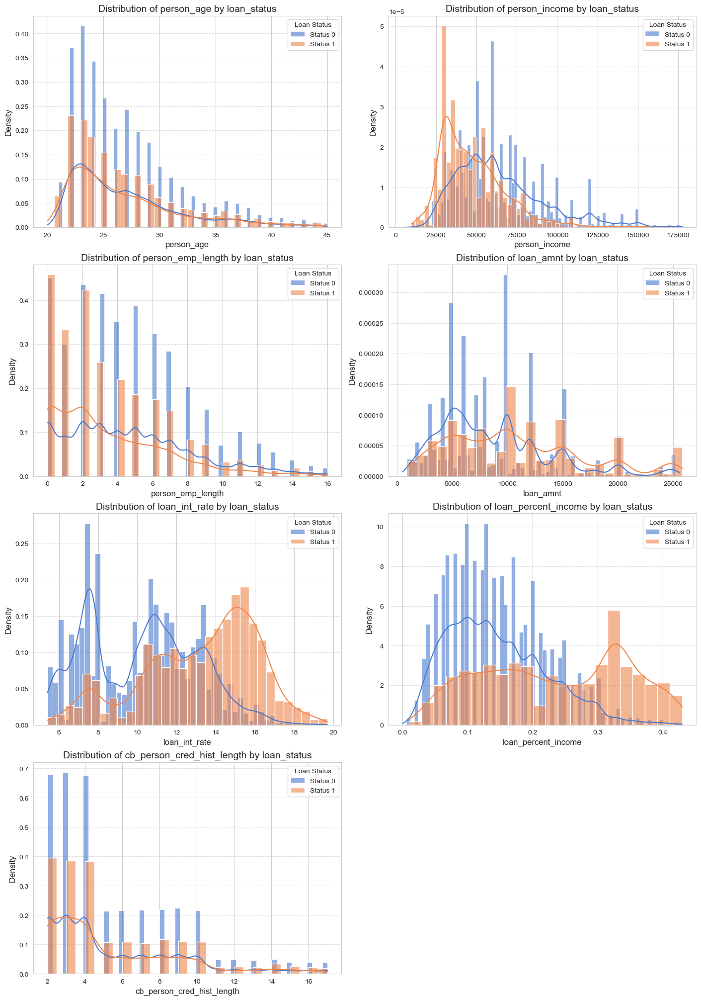

In [10]:
def plot_histograms(df, numerical_columns, target):
    # Remove outliers using Z-score
    df_no_outliers = df[(np.abs(stats.zscore(df[numerical_columns])) < 3).all(axis=1)]
    
    # Determine the number of rows and columns for subplots
    num_cols = 2
    num_rows = math.ceil(len(numerical_columns) / num_cols)
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(14, 5 * num_rows), constrained_layout=True)
    axes = axes.flatten()  # Flatten the axes array for easy iteration
    
    for i, col in enumerate(numerical_columns):
        # Plot for status 0
        sns.histplot(df_no_outliers[df_no_outliers[target] == 0][col], kde=True, color=sns.color_palette("muted")[0], stat='density', label='Status 0', alpha=0.6, ax=axes[i])
        
        # Plot for status 1
        sns.histplot(df_no_outliers[df_no_outliers[target] == 1][col], kde=True, color=sns.color_palette("muted")[1], stat='density', label='Status 1', alpha=0.6, ax=axes[i])
        
        axes[i].set_title(f'Distribution of {col} by {target}', fontsize=14)
        axes[i].set_xlabel(col, fontsize=12)
        axes[i].set_ylabel('Density', fontsize=12)
        axes[i].legend(title='Loan Status')
        axes[i].grid(axis='y', linestyle='--', alpha=0.7)
    
    # Remove any unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])
    
    plt.show()

plot_histograms(df, numerical_columns, 'loan_status')


**Person Income:** For Status 1 (loan not approved), there is a peak at lower income levels (around $30,000). This suggests that individuals with lower incomes are more likely to belong to this category. For Status 0, the income distribution appears more spread out with some peaks at higher income levels (around $60,000). This indicates that individuals in this group generally have higher incomes compared to those in Status 1.

**Loan Interest Rate:** There is a distinct separation between the two groups. Approved loans (Status 0) are largely associated with lower interest rates, while denied loans (Status 1) are more prevalent in higher interest rate categories. The KDE curve for Status 1 is higher than the curve for Status 0 until the 12% interest rate mark, after which the curve for Status 0 is higher, with a peak at around 16%.


**Loan Percentage of Income:** Similar to the loan interest rate, there is a distinct separation between the two groups.  In the part left to 0.25, the KDE line is higher for Status 0, with a peak at around 0.1. For the part right to 0.25, the KDE line is higher for Status 1, with a peak at around 0.35.




#### 2.2 Box plots

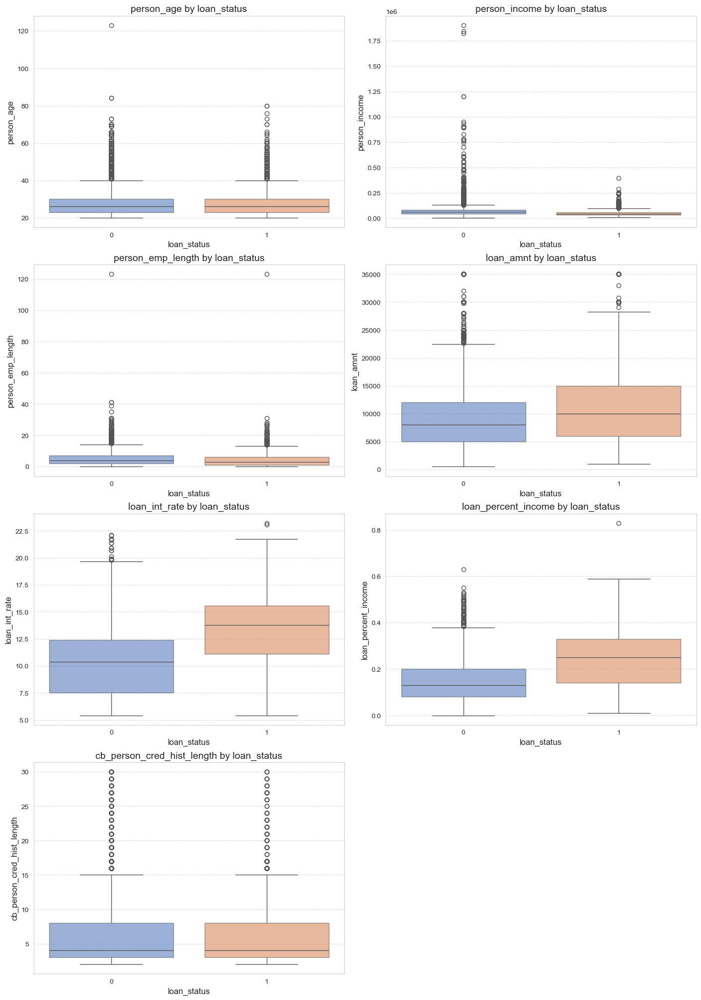

In [11]:
def plot_boxplots(df, numerical_columns, target):
    # Determine the number of rows and columns for subplots
    num_cols = 2
    num_rows = math.ceil(len(numerical_columns) / num_cols)
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(14, 5 * num_rows), constrained_layout=True)
    axes = axes.flatten()  # Flatten the axes array for easy iteration
    
    for i, col in enumerate(numerical_columns):
        box = sns.boxplot(x=target, y=col, data=df, hue=target, palette='muted', ax=axes[i], legend=False)
        for patch in box.patches:
            patch.set_alpha(0.6)  
        axes[i].set_title(f'{col} by {target}', fontsize=14)
        axes[i].set_xlabel(target, fontsize=12)
        axes[i].set_ylabel(col, fontsize=12)
        axes[i].grid(axis='y', linestyle='--', alpha=0.7)
    
    # Remove any unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])
    
    plt.show()

plot_boxplots(df, numerical_columns, 'loan_status')

We see that in all of the numerical features, there are outliers. Removing them might improve the performance of our models.

#### 2.3 Joint plots

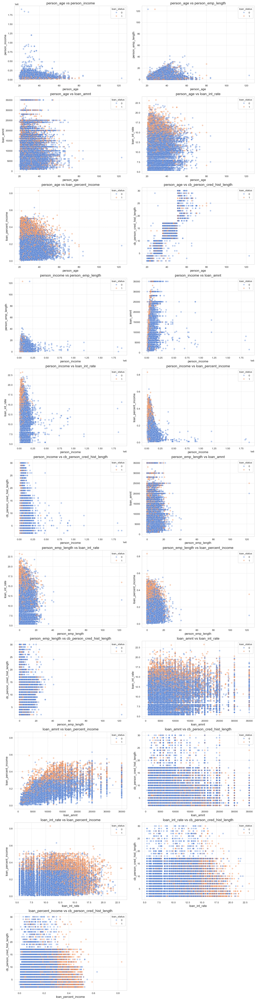

In [14]:
def plot_jointplots(df, numerical_columns, target):
    pairs = list(itertools.combinations(numerical_columns, 2))
    
    num_cols = 2
    num_rows = math.ceil(len(pairs) / num_cols)
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(14, 5 * num_rows), constrained_layout=True)
    axes = axes.flatten()  # Flatten the axes array for easy iteration
    
    for i, (x_col, y_col) in enumerate(pairs):
        sns.scatterplot(data=df, x=x_col, y=y_col, hue=target, alpha=0.4, ax=axes[i], palette='muted')
        axes[i].set_title(f'{x_col} vs {y_col}', fontsize=14)
        axes[i].set_xlabel(x_col, fontsize=12)
        axes[i].set_ylabel(y_col, fontsize=12)
        axes[i].grid(True, linestyle='--', alpha=0.7)
    
    # Remove any unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])
    
    plt.show()

plot_jointplots(df, numerical_columns, 'loan_status')

Here we see again the distinction between the two groups based on the loan interest rate and the loan percentage of income. There is no clear relationship between the features. We will remove the extreme outliers (z-score > 10) from the plots and see if we can get a better understanding of any relationship.


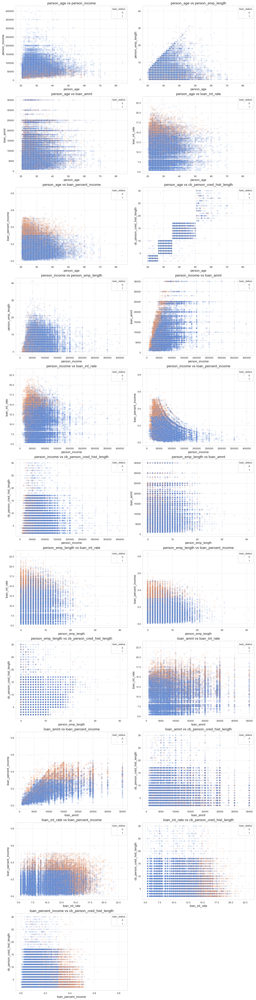

In [15]:
def plot_jointplots(df, numerical_columns, target):
    # Generate all unique pairs of numerical columns
    pairs = list(itertools.combinations(numerical_columns, 2))
    
    # Determine the number of rows and columns for subplots
    num_cols = 2
    num_rows = math.ceil(len(pairs) / num_cols)
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(14, 5 * num_rows), constrained_layout=True)
    axes = axes.flatten()  # Flatten the axes array for easy iteration
    
    for i, (x_col, y_col) in enumerate(pairs):
        # Remove outliers for the current pair of columns
        df_no_outliers = df[(np.abs(stats.zscore(df[[x_col, y_col]])) < 10).all(axis=1)]
        
        sns.scatterplot(data=df_no_outliers, x=x_col, y=y_col, hue=target, alpha=0.1, ax=axes[i], palette='muted')
        axes[i].set_title(f'{x_col} vs {y_col}', fontsize=14)
        axes[i].set_xlabel(x_col, fontsize=12)
        axes[i].set_ylabel(y_col, fontsize=12)
        axes[i].grid(True, linestyle='--', alpha=0.7)
    
    # Remove any unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])
    
    plt.show()

plot_jointplots(df, numerical_columns, 'loan_status')

By removing the outliers, the nonlinear relationship between the person_income and the loan_percent_income becomes more visible. We see that as person_income increases, the loan_percent_income decreases. This is expected because individuals with higher incomes can handle larger loan amounts without the loan constituting a significant portion of their income.


### 3. Categorical columns

All caterorical columns are of low cardinality

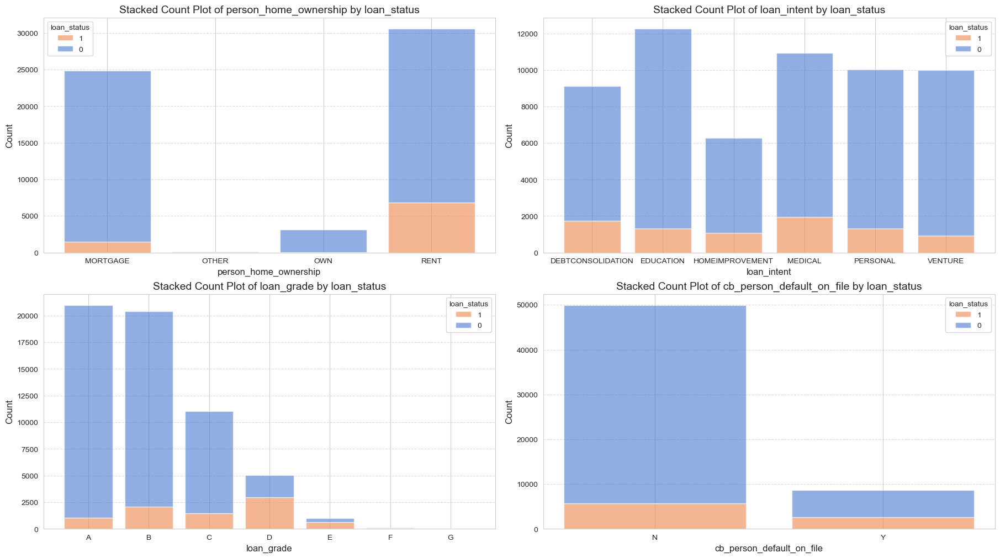

In [16]:
def plot_stacked_count_on_countplot(df, categorical_columns, target):
    # Determine the number of rows and columns for subplots
    num_cols = 2
    num_rows = math.ceil(len(categorical_columns) / num_cols)
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, 5 * num_rows), constrained_layout=True)
    axes = axes.flatten()  # Flatten the axes array for easy iteration
    
    for i, col in enumerate(categorical_columns):
        # Ensure target is treated as categorical
        df[target] = df[target].astype('category')
        
        # Define order for loan_grade if it's the current column
        if col == 'loan_grade':
            order = ['A', 'B', 'C', 'D', 'E', 'F', 'G']
        else:
            order = df[col].unique()
        
        # Create a crosstab to get counts
        crosstab = pd.crosstab(df[col], df[target])
        
        # Reorder columns to have status 1 at the bottom
        crosstab = crosstab[[1, 0]]
        
        # Get colors from the 'muted' palette and reorder them
        colors = sns.color_palette('muted', n_colors=2)
        colors = [colors[1], colors[0]]  # Ensure blue is for status 1
        
        # Plot stacked bars
        bottom = None
        for j, (label, color) in enumerate(zip(crosstab.columns, colors)):
            axes[i].bar(crosstab.index, crosstab[label], bottom=bottom, color=color, label=label, alpha=0.6)
            if bottom is None:
                bottom = crosstab[label]
            else:
                bottom += crosstab[label]
        
        axes[i].set_title(f'Stacked Count Plot of {col} by {target}', fontsize=14)
        axes[i].set_xlabel(col, fontsize=12)
        axes[i].set_ylabel('Count', fontsize=12)
        axes[i].legend(title=target, labels=['1', '0'])
        axes[i].grid(axis='y', linestyle='--', alpha=0.7)
    
    # Remove any unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])
    
    plt.show()

plot_stacked_count_on_countplot(df, categorical_columns, 'loan_status')

Renters and individuals with a mortgage have higher counts of both approved and denied loans, with renters showing a higher proportion of denied loans compared to mortgage holders. Individuals who own their homes have the fewest loans overall, but the proportion of approvals is close to 100%.

The proportions of approvals to denials appear fairly consistent across different loan intents, with education loans showing a slightly higher approval rate compared to other categories, such as debt consolidation and home improvement.

Loans graded A, B, or C dominate in terms of count and show a higher proportion of approved loans. As we move from grades A to G, both the count and approval rates decrease. From grade D onwards, the number of loans denied exceeds the number of loans approved.

The count of loans for individuals with no default on file is significantly higher, with a corresponding increase in approval rates. About one-third of the loans for individuals with a default on file are not approved.

### 4. Initial Evaluation

The ROC-AUC score of a random classifier is 0.5. Next, we will use two models to get theinitial estimation of the ROC-AUC score that we can get with out-of-fold predictions. We will use a `HistGradientBoostingClassifier` and a `CatBoostClassifier` that generally perform very well without tuning.

First, we will define the score_model function that does repeated K-Fold cross-validation and prints the mean ROC-AUC and the standard error. We will use both `RepeatedKFold` and `RepeatedStratifiedKFold` and compare the results.


In [40]:
def score_model(model, X, y, n_splits=5, n_repeats=2):
    ''' Function to score the model using repeated k-fold cross-validation
    and print the mean ROC-AUC and the standard error.
    Args:
        model: the model to score
        X: dataframe of the features
        y: series of the target
        n_splits: the number of splits for the cross-validation
        n_repeats: the number of repeats for the cross-validation
    Returns:
        mean_roc_auc: the mean ROC-AUC
        std_error: the standard error of the ROC-AUC
    '''

    rkf = RepeatedKFold(n_splits=n_splits, n_repeats=n_repeats, random_state=42)
    scores = cross_val_score(model, X, y, scoring='roc_auc', cv=rkf, n_jobs=-1)
    
    mean_roc_auc = np.mean(scores)
    std_error = np.std(scores) / np.sqrt(len(scores))
    
    print(f"Mean ROC-AUC: {mean_roc_auc:.4f}, \n"
          f"Standard Error: {std_error:.4f}")
    
    #return mean_roc_auc, std_error

#### Histogram-based Gradient Boosting Classifier:

In [18]:
# Not Stratified K-Fold, 10 repeats

model_hist = HistGradientBoostingClassifier(random_state=42, categorical_features=categorical_columns)
score_model(model_hist, X, y)


Mean ROC-AUC: 0.9526, 
Standard Error: 0.0004


In [20]:
# Stratified K-Fold, 10 repeats

model_hist = HistGradientBoostingClassifier(random_state=42, categorical_features=categorical_columns)
score_model(model_hist, X, y)


Mean ROC-AUC: 0.9523, 
Standard Error: 0.0005


#### CatBoostClassifier:

In [23]:
# Not Stratified, 10 repeats

model_cb = CatBoostClassifier(
    verbose=0,
    random_state=42,
    loss_function='Logloss', 
    eval_metric='AUC',        
    cat_features=categorical_columns
)
score_model(model_cb, X, y)

Mean ROC-AUC: 0.9554, 
Standard Error: 0.0003


In [21]:
# Stratified, 10 repeats

model_cb = CatBoostClassifier(
    verbose=0,
    random_state=42,
    loss_function='Logloss', 
    eval_metric='AUC',        
    cat_features=categorical_columns
)
score_model(model_cb, X, y)

Mean ROC-AUC: 0.9553, 
Standard Error: 0.0005


It seems that using RepeatedKFold instead of the stratified version gives slightly improved performance.

We will use class weights to see if it leads to better predictions.

In [24]:
# Not Stratified, 10 repeats

class_weights = [1, 6]  

model_cb = CatBoostClassifier(
    verbose=0,
    random_state=42,
    loss_function='Logloss', 
    eval_metric='AUC',
    cat_features=categorical_columns,
    class_weights=class_weights
)

score_model(model_cb, X, y)

Mean ROC-AUC: 0.9564, 
Standard Error: 0.0003


Assigning the class weights helped the model to perform slightly better. 

Let's see the feature importances for the two models.

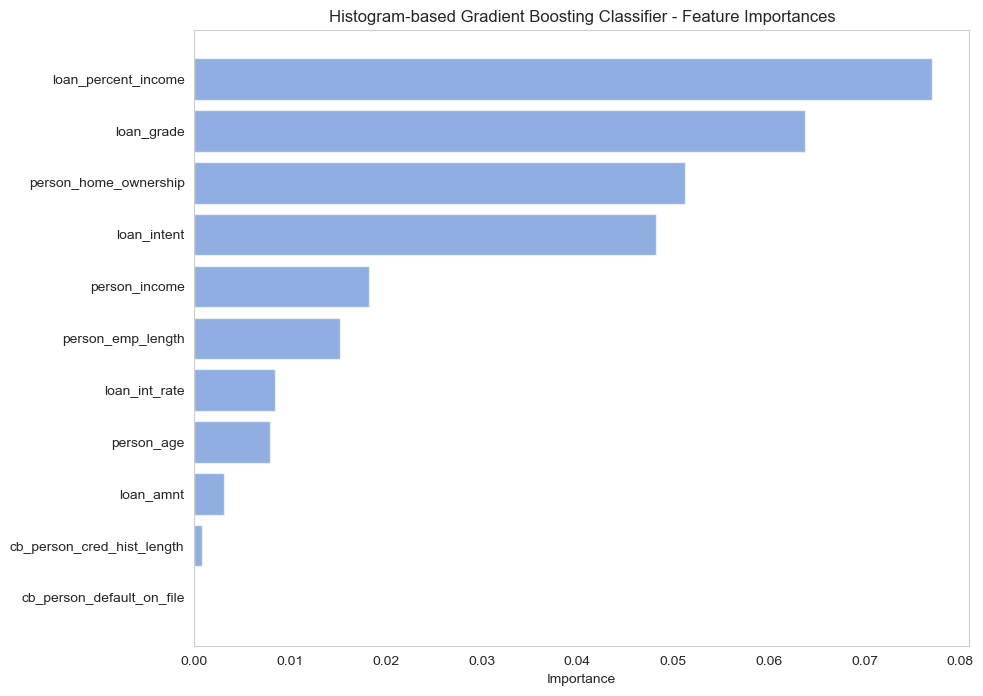

                       Feature  Importance
8          loan_percent_income    0.077083
5                   loan_grade    0.063786
2        person_home_ownership    0.051217
4                  loan_intent    0.048197
1                person_income    0.018200
3            person_emp_length    0.015236
7                loan_int_rate    0.008405
0                   person_age    0.007893
6                    loan_amnt    0.003069
10  cb_person_cred_hist_length    0.000767
9    cb_person_default_on_file    0.000008


In [27]:
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.ensemble import HistGradientBoostingClassifier

# Make predictions on the test set
model_hist = HistGradientBoostingClassifier(random_state=42, categorical_features=categorical_columns)
model_hist.fit(X, y)
y_pred_test = model_hist.predict(df_test)

# Compute permutation importances for the test set
result_test = permutation_importance(model_hist, df_test, y_pred_test, n_repeats=10, random_state=42, n_jobs=-1)

# Create a DataFrame for the test set importances
importances_df_test = pd.DataFrame({
    'Feature': df_test.columns,
    'Importance': result_test.importances_mean
})

# Sort the DataFrame by importance
importances_df_test = importances_df_test.sort_values(by='Importance', ascending=False)

# Select a single color from the 'muted' palette
color = sns.color_palette("muted")[0]

# Plot the feature importances for the test set
plt.figure(figsize=(10, 8))
plt.barh(importances_df_test['Feature'], importances_df_test['Importance'], color=color, alpha=0.6)
plt.xlabel('Importance')
plt.title('Histogram-based Gradient Boosting Classifier - Feature Importances')
plt.gca().invert_yaxis()
plt.grid(False)  # Remove gridlines
plt.show()

print(importances_df_test)

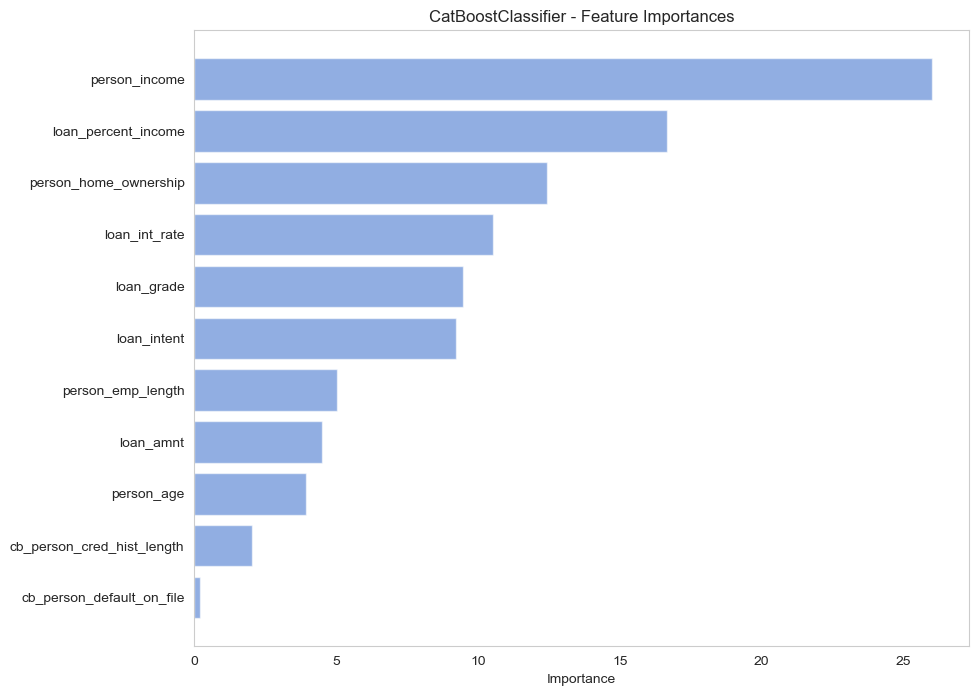

                       Feature  Importance
1                person_income   26.014564
8          loan_percent_income   16.664657
2        person_home_ownership   12.413075
7                loan_int_rate   10.525454
5                   loan_grade    9.475489
4                  loan_intent    9.221166
3            person_emp_length    5.016788
6                    loan_amnt    4.507647
0                   person_age    3.941085
10  cb_person_cred_hist_length    2.024259
9    cb_person_default_on_file    0.195817


In [28]:
from catboost import CatBoostClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Initialize and fit the CatBoost model
model_cb = CatBoostClassifier(
    verbose=0,
    random_state=42,
    loss_function='Logloss',  
    eval_metric='AUC',      
    cat_features=categorical_columns,
    class_weights=class_weights
)
model_cb.fit(X, y)

# Get feature importances
importances = model_cb.feature_importances_

# Create a DataFrame for better visualization
importances_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': importances
})

# Sort the DataFrame by importance
importances_df = importances_df.sort_values(by='Importance', ascending=False)

# Select a single color from the 'muted' palette
color = sns.color_palette("muted")[0]

# Plot the feature importances
plt.figure(figsize=(10, 8))
plt.barh(importances_df['Feature'], importances_df['Importance'], color=color, alpha=0.6)
plt.xlabel('Importance')
plt.title('CatBoostClassifier - Feature Importances')
plt.gca().invert_yaxis()  # Invert y-axis to have the most important feature at the top
plt.grid(False)  # Remove gridlines
plt.show()

# Print the feature importances
print(importances_df)

Assigning the class weights helped the model to perform slightly better. 

We will now use the `CatBoostClassifier` to make predictions on the test set and create a submission file.


In [29]:
from catboost import CatBoostClassifier

class_weights = [1, 6] 

model_cb = CatBoostClassifier(
    verbose=0,
    random_state=42,
    loss_function='Logloss', 
    eval_metric='AUC',        
    cat_features=categorical_columns,
    class_weights=class_weights
)

model_cb.fit(X, y)

preds = model_cb.predict_proba(df_test)[:, 1]
preds


array([0.99949298, 0.09582766, 0.8544109 , ..., 0.01748204, 0.35308522,
       0.99355411])

In [71]:
# create a submission file for the test set
submission = pd.DataFrame({
    'id': df_test.index,
    'loan_status': preds
})

submission.to_csv('submission.csv', index=False)

# Kaggle public score: 0.95029
# Kaggle highest public score: 0.97331
# cv: 0.9564

We will do a first evaluation of the performance of the LightAutoML model with the original data.

In [7]:
from lightautoml.automl.presets.tabular_presets import TabularAutoML
from lightautoml.tasks import Task

In [8]:
import numpy as np
import torch

target_col = 'loan_status'

N_THREADS = 4
N_FOLDS = 5
RANDOM_STATE = 42
TEST_SIZE = 0.2
TIMEOUT = 300
np.random.seed(RANDOM_STATE)
torch.set_num_threads(N_THREADS)

task = Task('binary', loss='logloss', metric='auc')



#print(f'OOF score: {roc_auc_score(df[target_col].values, out_of_fold_predictions.data[:, 0])}')

In [9]:
from sklearn.metrics import roc_auc_score

automl = TabularAutoML(
    task = task,
    timeout = TIMEOUT,
    cpu_limit = N_THREADS,
    general_params = {'use_algos':[['linear_l2', 'lgb', 'lgb_tuned']]},
    selection_params={'mode' : 0},
    tuning_params = {'max_tuning_time': 200},
    reader_params = {'n_jobs': N_THREADS, 'cv': N_FOLDS, 'random_state': RANDOM_STATE}
)

out_of_fold_predictions = automl.fit_predict(
    df,
    roles = {
        'target': target_col,
        #'drop': ['id']
    }, 
    verbose = 1
)

print(f'OOF score: {roc_auc_score(df[target_col].values, out_of_fold_predictions.data[:, 0])}')


[15:57:52] Stdout logging level is INFO.
[15:57:52] Task: binary

[15:57:52] Start automl preset with listed constraints:
[15:57:52] - time: 300.00 seconds
[15:57:52] - CPU: 4 cores
[15:57:52] - memory: 16 GB

[15:57:52] Train data shape: (58645, 12)

[15:57:56] Layer 1 train process start. Time left 296.08 secs
[15:57:57] Start fitting Lvl_0_Pipe_0_Mod_0_LinearL2 ...
[15:58:07] Fitting Lvl_0_Pipe_0_Mod_0_LinearL2 finished. score = 0.9414876861249168
[15:58:07] Lvl_0_Pipe_0_Mod_0_LinearL2 fitting and predicting completed
[15:58:07] Time left 284.97 secs

[15:58:08] Start fitting Lvl_0_Pipe_1_Mod_0_LightGBM ...
[15:58:26] Fitting Lvl_0_Pipe_1_Mod_0_LightGBM finished. score = 0.9638939954865098
[15:58:26] Lvl_0_Pipe_1_Mod_0_LightGBM fitting and predicting completed
[15:58:26] Start hyperparameters optimization for Lvl_0_Pipe_1_Mod_1_Tuned_LightGBM ... Time budget is 156.17 secs
[15:58:26] Copying TaskTimer may affect the parent PipelineTimer, so copy will create new unlimited TaskTimer
[

In [10]:
# Make predictions on the test set
preds_automl = automl.predict(df_test)

# If you need to access the predicted probabilities or classes, you can do so like this:
# For probabilities:
preds_automl.data[:, 0]

array([0.99186325, 0.0045673 , 0.57389283, ..., 0.00420982, 0.36011273,
       0.9441217 ], dtype=float32)